# **Proyecto Final bootcamp Keep coding de Inteligencia artifical**

---

Para el proceso de entrenamiento se han utilizado las siguientes herramientas:

*   Google colab
*   Roboflow (https://roboflow.ai)
*   Weights & Biases (https://wandb.ai/)
*   Tensorboard
*   Google drive


Antes de realizar el entrenamiento y el test hemos realizado el etiquetado de las imágenes. 

*   Se han etiquetado imágenes de los siguientes elementos: **potato, orange, pineapple, apple, lemon, pear, banana, pepper y carrot**
*   Al menos hay 70 imágenes de cada clase
*   En total hay cerca de 700 imágenes
*   El etiquetado se ha realizado con la herramienta labelImg, utilizando el formato YOLO


Para la creación del dataset de entrenamiento se ha utilizado la herramienta roboflow (http://roboflow.ai)
El dataset original se ha dividido en 3 partes: 70% para train, 20 % para evaluación y 10% para test

# Entrenamiento de la deteccion y clasificación de imágenes y verduras

# Paso1: Instalacion de requerimientos

In [1]:
#Clonamos el desde github yolov5
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

# Importamos algunas librerías
import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 12852, done.
remote: Total 12852 (delta 0), reused 0 (delta 0), pack-reused 12852
Receiving objects: 100% (12852/12852), 11.81 MiB | 17.01 MiB/s, done.
Resolving deltas: 100% (8925/8925), done.
/content/yolov5
     |████████████████████████████████| 596 kB 31.7 MB/s 
     |████████████████████████████████| 145 kB 42.6 MB/s 
     |████████████████████████████████| 178 kB 66.3 MB/s 
     |████████████████████████████████| 1.1 MB 52.9 MB/s 
     |████████████████████████████████| 67 kB 6.0 MB/s 
     |████████████████████████████████| 54 kB 2.9 MB/s 
     |████████████████████████████████| 138 kB 62.3 MB/s 
     |████████████████████████████████| 63 kB 1.6 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
datas

In [2]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [3]:
# Establecemos directorio dende estará el dataset
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [4]:
#instalamos roboflow y nos conectamos a la cuenta donde está el dataset
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="u0uh91kebFlzAV1rh5Ct")
project = rf.workspace("miguel-angel-perez").project("kcpf-objetct-detection")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/kcpf-objetct-detection-1 in yolov5pytorch:: 100%|██████████| 1354/1354 [00:01<00:00, 1040.07it/s]


In [ ]:
# Instalamos y nos logeamos Weights & Biases para realizar un seguimiento de la métricas del proceso
%pip install -q wandb
import wandb

In [ ]:
wandb.login()

# Paso 2: Entrenamiento del modelo

Estos son los argumentos que pasamos para entrenamiento:
- **img:** Tamaño de la imagen para entrenar
- **batch:** Tamaño del batch
- **epochs:** Número de épocas
- **data:** fichero "yaml" donde se indica las clases y directorio del dataset
- **weights:** Pesos para transfer learning. Si lo dejamos vació entrenará desde cero. Utilizamos pesos previamente preentrenados con el dataset coco128
- **cache:** cache de imágenes para entrenar más rápido

In [ ]:
#!python train.py --img 320 --batch 16 --epochs 2000 --data {dataset.location}/data.yaml --weights yolov5x.pt --cache
#!python train.py --img 640 --batch 16 --epochs 200 --data {dataset.location}/data.yaml --weights yolov5x.pt --cache
!python train.py --img 416 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5x.pt --cache

wandb: Currently logged in as: miguel-cti (use `wandb login --relogin` to force relogin)
train: weights=yolov5x.pt, cfg=, data=/content/datasets/kcpf-objetct-detection-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-135-g7926afc torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cl

# Evaluación del modelo 
Con tensorboard y con en la web https://wandb.ai, podemos ver las métricas del entrenamiento

In [ ]:
# Ejecutamos tensorboard una vez entrenado. Utiliza las métricas almacenadas en la carpeta "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

# Prueba del modelo en la imagenes de test
Ejecutamos pruebas de detección y clasificación con las imágenes de test, del directorio `test/images` 

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/kcpf-objetct-detection-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-135-g7926afc torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 444 layers, 86227246 parameters, 0 gradients, 204.1 GFLOPs
image 1/62 /content/datasets/kcpf-objetct-detection-1/test/images/apple_28_jpg.rf.790d9dbaf001301f459be80b259c749c.jpg: 416x416 1 apple, 2 bananas, 1 lemon, Done. (0.023s)
image 2/62 /content/datasets/kcpf-objetct-detection-1/test/images/apple_42_jpg.rf.4d85d71e4ae89c7bd69b6c1c7a7672f7.jpg: 416x416 1 banana, 2 lemons, Done. 

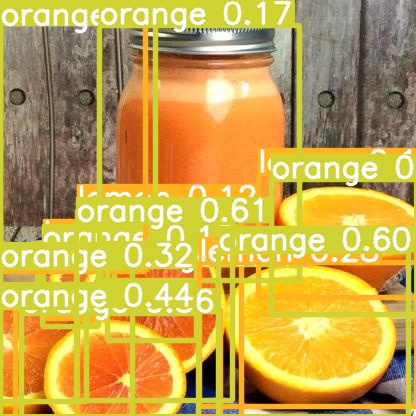

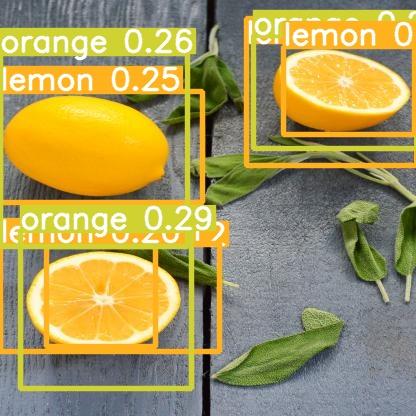

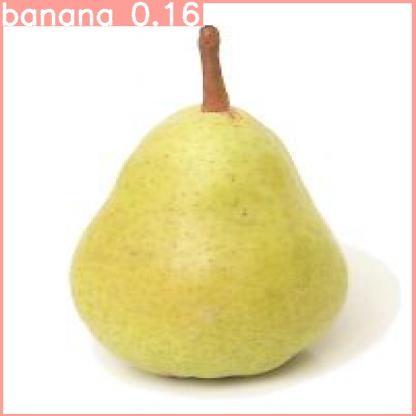

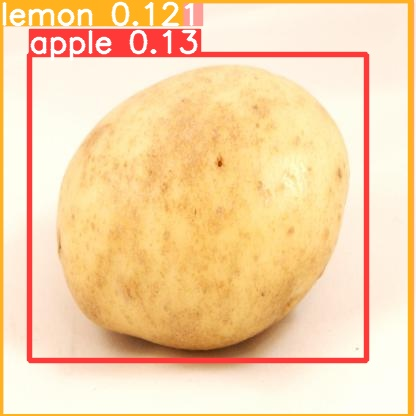

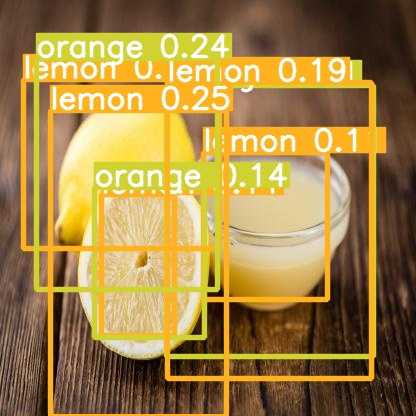

...

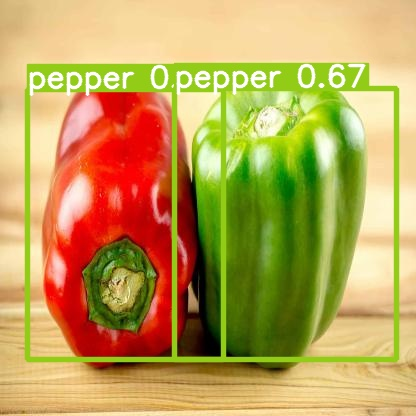

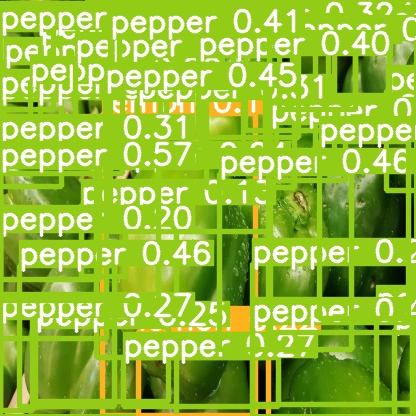

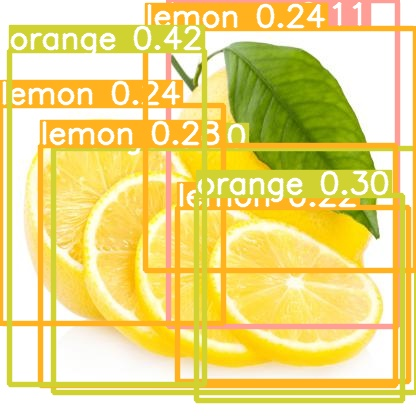

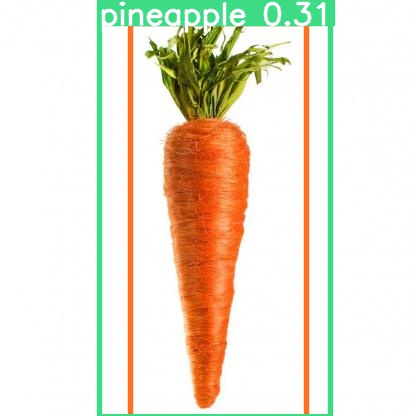

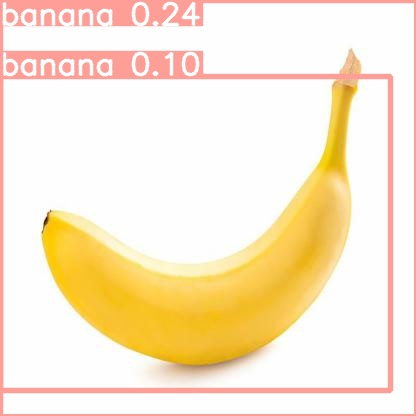

In [ ]:
#Mostramos la deteccion de las imágenes en la carpeta de test

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #todas son JPG
    display(Image(filename=imageName))
    print("\n")

# Conclusiones

Como vemos el resultado de la detección y clasificación puede mejorar. La detección mejoraría con los siguientes pasos:

*   Etiquetando mejor las imágenes, no dejando ningúna fruta/verudra completa o parte de ella sin etiquetar
*   Etiquetando un mayor número de imágenes. Cuanto más etiquetemos la detección será mayor.
*   Aumentando el número de instancias de cada clase

Aunque el mAP es del orden del 83% es una medida engañosa y no correcta. El problema entre el mAP y la detección real es fruto del mal etiquetado de las imágenes.




In [ ]:
#exportamos el modelo para ponerlo en producción
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>